In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import re
import string
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.util import ngrams
from nltk import FreqDist
from wordcloud import WordCloud
from langdetect import detect_langs
import os
import glob
from textblob import TextBlob, Word
from sklearn.feature_extraction.text import TfidfVectorizer
nltk.download("stopwords")
nltk.download('punkt')

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Error loading stopwords: <urlopen error [Errno 8] nodename
[nltk_data]     nor servname provided, or not known>
[nltk_data] Error loading punkt: <urlopen error [Errno 8] nodename nor
[nltk_data]     servname provided, or not known>


In [2]:
df = pd.read_csv('Resume.csv').reset_index(drop=True)
df.head()

,ID,Resume_str,Resume_html,Category
0,16852973,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,"<div class=""fontsize fontface vmargins hmargin...",HR
1,22323967,"HR SPECIALIST, US HR OPERATIONS ...","<div class=""fontsize fontface vmargins hmargin...",HR
2,33176873,HR DIRECTOR Summary Over 2...,"<div class=""fontsize fontface vmargins hmargin...",HR
3,27018550,HR SPECIALIST Summary Dedica...,"<div class=""fontsize fontface vmargins hmargin...",HR
4,17812897,HR MANAGER Skill Highlights ...,"<div class=""fontsize fontface vmargins hmargin...",HR


In [3]:
df.shape

(2484, 4)

In [4]:
max(df.Resume_str.str.len())

38842

In [5]:
sum(df.Resume_str.str.len()>1500)

2466

In [6]:
df[df.Resume_str.str.len()>1500]['Resume_str']

0                HR ADMINISTRATOR/MARKETING ASSOCIATE\...
1                HR SPECIALIST, US HR OPERATIONS      ...
2                HR DIRECTOR       Summary      Over 2...
3                HR SPECIALIST       Summary    Dedica...
4                HR MANAGER         Skill Highlights  ...
                              ...                        
2479             RANK: SGT/E-5 NON- COMMISSIONED OFFIC...
2480             GOVERNMENT RELATIONS, COMMUNICATIONS ...
2481             GEEK SQUAD AGENT         Professional...
2482             PROGRAM DIRECTOR / OFFICE MANAGER    ...
2483             STOREKEEPER II       Professional Sum...
Name: Resume_str, Length: 2466, dtype: object

In [7]:
sum(df.Resume_str.str.len()<1500)

18

In [8]:
df.sample(10)

,ID,Resume_str,Resume_html,Category
282,10089434,INFORMATION TECHNOLOGY TECHNICIAN I ...,"<div class=""fontsize fontface vmargins hmargin...",INFORMATION-TECHNOLOGY
2237,20992320,MANAGEMENT CONSULTANT Skills ...,"<div class=""fontsize fontface vmargins hmargin...",BANKING
2,33176873,HR DIRECTOR Summary Over 2...,"<div class=""fontsize fontface vmargins hmargin...",HR
143,38744475,INTERIOR DESIGNER Summary T...,"<div class=""fontsize fontface vmargins hmargin...",DESIGNER
105,30563572,HR MANAGER/BUSINESS PARTNER ...,"<div class=""fontsize fontface vmargins hmargin...",HR
1015,79376680,SALES Summary When thinking...,"<div class=""fontsize fontface vmargins hmargin...",SALES
1184,15602094,IT CONSULTANT Professional ...,"<div class=""fontsize fontface vmargins hmargin...",CONSULTANT
2119,20470943,ADMINISTRATIVE ASSISTANT Summar...,"<div class=""fontsize fontface vmargins hmargin...",PUBLIC-RELATIONS
253,22450718,INFORMATION TECHNOLOGY SPECIALIST ...,"<div class=""fontsize fontface vmargins hmargin...",INFORMATION-TECHNOLOGY
1059,13348915,SALES ASSOCIATE Summary Punc...,"<div class=""fontsize fontface vmargins hmargin...",SALES


In [9]:
df.shape

(2484, 4)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2484 entries, 0 to 2483
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   ID           2484 non-null   int64 
 1   Resume_str   2484 non-null   object
 2   Resume_html  2484 non-null   object
 3   Category     2484 non-null   object
dtypes: int64(1), object(3)
memory usage: 77.8+ KB


In [11]:
print(df['Category'].unique())

['HR' 'DESIGNER' 'INFORMATION-TECHNOLOGY' 'TEACHER' 'ADVOCATE'
 'BUSINESS-DEVELOPMENT' 'HEALTHCARE' 'FITNESS' 'AGRICULTURE' 'BPO' 'SALES'
 'CONSULTANT' 'DIGITAL-MEDIA' 'AUTOMOBILE' 'CHEF' 'FINANCE' 'APPAREL'
 'ENGINEERING' 'ACCOUNTANT' 'CONSTRUCTION' 'PUBLIC-RELATIONS' 'BANKING'
 'ARTS' 'AVIATION']


In [12]:
print(df['Category'].value_counts())

BUSINESS-DEVELOPMENT      120
INFORMATION-TECHNOLOGY    120
FINANCE                   118
ACCOUNTANT                118
CHEF                      118
ADVOCATE                  118
ENGINEERING               118
AVIATION                  117
FITNESS                   117
SALES                     116
BANKING                   115
CONSULTANT                115
HEALTHCARE                115
CONSTRUCTION              112
PUBLIC-RELATIONS          111
HR                        110
DESIGNER                  107
ARTS                      103
TEACHER                   102
APPAREL                    97
DIGITAL-MEDIA              96
AGRICULTURE                63
AUTOMOBILE                 36
BPO                        22
Name: Category, dtype: int64


# count of Category

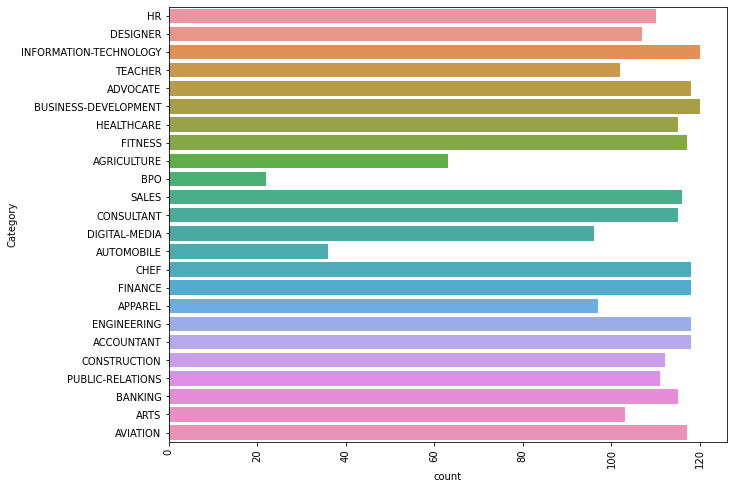

In [13]:
plt.figure(figsize=(10,8))
plt.xticks(rotation=90)
sns.countplot(y="Category", data=df);

In [14]:
max(df.Resume_str.str.len())

38842

In [15]:
min(df.Resume_str.str.len())

21

# Preprocessing


---

---
# Check Duplicates

In [16]:
df.duplicated().sum()

0

# drop unused columns

In [17]:
#df.drop(['ID','Resume_html','Category'], axis = 1, inplace=True)
df.drop(['ID','Resume_html'], axis = 1, inplace=True)


df

,Resume_str,Category
0,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,HR
1,"HR SPECIALIST, US HR OPERATIONS ...",HR
2,HR DIRECTOR Summary Over 2...,HR
3,HR SPECIALIST Summary Dedica...,HR
4,HR MANAGER Skill Highlights ...,HR
...,...,...
2479,RANK: SGT/E-5 NON- COMMISSIONED OFFIC...,AVIATION
2480,"GOVERNMENT RELATIONS, COMMUNICATIONS ...",AVIATION
2481,GEEK SQUAD AGENT Professional...,AVIATION
2482,PROGRAM DIRECTOR / OFFICE MANAGER ...,AVIATION


# Remove:

Lowercasing text

In [18]:
df['Resume_str'] = df['Resume_str'].str.lower()

In [19]:
df['Resume_str'].sample(20)

1821             accountant             highlights    ...
1987             training specialist - construction eq...
1178             consultant       summary    business ...
1632             buyer/planner           summary    de...
1428             dfw personal chef         experience ...
1668             coordinating manager       summary   ...
1175             consultant         executive profile ...
650              vp of business development       prof...
1585             head of accounts and finance         ...
1084             sales associate       summary     exp...
1311             digital marketing director           ...
1367             chef       summary    i have been in ...
592              business development manager         ...
2083             billing services associate           ...
2123             development manager               exp...
1125             consultant       profile    around 5 ...
1051             sales associate           summary    ...
1200          

Punctuation


In [20]:
df['Resume_str'] = df['Resume_str'].str.replace('[^A-Za-z0-9 ]', "")

In [21]:
df['Resume_str'].sample(20)

1240             director         professional summary...
240              information technology intern       p...
2039             public relations director            ...
258              information technology specialist    ...
2311             middle school principal         execu...
1470             ownerchef       summary     chef with...
1000             sales       summary    over 17 years ...
1382             executive chef       summary     dedi...
1664             product marketing manager       profe...
2270             expressive arts program leader       ...
265              information technology student       ...
2112             senior account manager       summary ...
1868             corporate accountant         summary ...
1841             accountant         summary      resul...
2257             revolving credit support specialist  ...
168              digital designer           summary   ...
2263             marketing manager         summary    ...
2328          

White space 

In [22]:

df['Resume_str'] = df['Resume_str'].str.replace('\s+', ' ')

In [23]:
df['Resume_str'].sample(20)

2406     force analyst summary profilehonorably discha...
2142     executive director professional summary nonpr...
1664     product marketing manager professional summar...
1507     finance manager highlights essbase peoplesoft...
1145     consultant experience 072011 current company ...
1711     engineering assistant career focus my full na...
985      sr campus recruiter summary solutions and res...
1239     implementation consultant summary resultsorie...
990      buyer summary over 1 year of end to end exper...
2085     special events coordinator summary marketing ...
1836     accountant interests buffalo creek golf club ...
1022     sales associategolf sales associate executive...
1994     laboer floor construction worker all a round ...
457      advocate general professional summary over el...
12       hr manager summary to obtain a position that ...
2241     manager of golf operations career focus innov...
1986     construction and design project manager summa...
272      infor

In [24]:
#df['Resume_str'][:2448].apply(lambda txt: " ".join([st.stem(word) for word in word if not word.isdigit()]))

Stop words 

In [25]:
stop = stopwords.words('english')
df['Resume_str'] = df['Resume_str'].apply(lambda txt: " ".join(word for word in txt.split() if word not in stop))

In [26]:
#df['Resume_str'] = re.sub(r'\d+', '', '9099876')

In [27]:
df['Resume_str'].sample(20)

1419    executive chef summary accomplished chef seaso...
2310    video director east coast video enterprise bra...
516     sexual assault crisis counselor victim advocat...
2448    supervisor summary supervisor two years corros...
2078    ward clerk unit secretary admissions dispositi...
1344    sr business systems analyst career overview mo...
261     information technology specialist infosec summ...
150     graphic designer summary versatile professiona...
1003    sales professional summary want challenging oc...
472     school success advocate accomplishments ymca c...
2111    bartender experience bartender 052018 company ...
1058    sales team executive summary resultsfocused ma...
201     marketing specialist graphic designer professi...
2240    assistant manager summary 7 yrs management cus...
1382    executive chef summary dedicated hardworking r...
1313    digital marketing intern education 2015 bachel...
625     director business development summary professi...
1529    financ

In [28]:
newStopWords = ['city','state','company','name']
#stop.append(newStopWords)

Delete the words (city ,state, company, name) becuase it repeated alot. 

In [29]:
stop

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [34]:
df['Resume_str'] = df['Resume_str'].apply(lambda t: " ".join(word for word in t.split() if word not in stop))

In [35]:
#stop

## Convert  to string 

In [36]:
resume= np.concatenate(df.values)
resume

array(['hr administratormarketing associatehr administrator summary dedicated customer service manager 15 years experience hospitality customer service management respected builder leader customerfocused teams strives instill shared enthusiastic commitment customer service highlights focused customer satisfaction team management marketing savvy conflict resolution techniques training development skilled multitasker client relations specialist accomplishments missouri dot supervisor training certification certified ihg customer loyalty marketing segment hilton worldwide general manager training certification accomplished trainer cross server hospitality systems hilton onq micros opera pms fidelio opera reservation system ors holidex completed courses seminars customer service sales strategies inventory control loss prevention safety time management leadership performance assessment experience hr administratormarketing associatehr administrator dec 2013 current helps develop policies dir

In [37]:
listToStr = ' '.join(map(str, resume))
  
print(listToStr) 

hr administratormarketing associatehr administrator summary dedicated customer service manager 15 years experience hospitality customer service management respected builder leader customerfocused teams strives instill shared enthusiastic commitment customer service highlights focused customer satisfaction team management marketing savvy conflict resolution techniques training development skilled multitasker client relations specialist accomplishments missouri dot supervisor training certification certified ihg customer loyalty marketing segment hilton worldwide general manager training certification accomplished trainer cross server hospitality systems hilton onq micros opera pms fidelio opera reservation system ors holidex completed courses seminars customer service sales strategies inventory control loss prevention safety time management leadership performance assessment experience hr administratormarketing associatehr administrator dec 2013 current helps develop policies directs coo

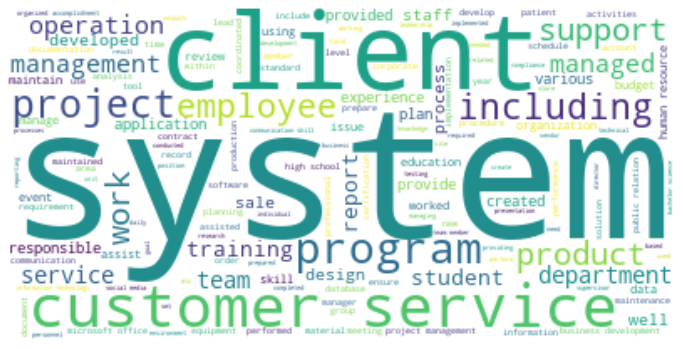

In [38]:
plt.figure(figsize=(12,10))
wordcloud_res = WordCloud(max_font_size=200, background_color="white").generate(listToStr) 
plt.imshow(wordcloud_res, interpolation="bilinear")
plt.axis('off')
plt.title("");

---
---
# Lemmatization & Stemming

In [39]:
#from nltk.stem import WordNetLemmatizer 
#lemmatizer = WordNetLemmatizer()
#print(lemmatizer.lemmatize("blogs"))


In [40]:
# Stemming
 #df['Resume_str'] = df['Resume_str'].apply(lambda txt: " ".join([Word(word).lemmatize() for word in txt.split()]))

In [41]:
#st = PorterStemmer()
#df['Resume_str'][:2448].apply(lambda txt: " ".join([st.stem(word) for word in txt.split()]))

In [42]:
#Word("years").lemmatize()

# Spelling Correction

In [ ]:
#df['Resume_str']= df['Resume_str'].apply(lambda txt: str(TextBlob(txt).correct()))

---


## Superviced Classification

In [ ]:
df.loc[df['Category'] == "HR", 'Category_N'] = 0
df.loc[df['Category'] == "DESIGNER", 'Category_N'] = 1

df.loc[df['Category'] == "INFORMATION-TECHNOLOGY", 'Category_N'] = 2

df.loc[df['Category'] == "TEACHER", 'Category_N'] = 3

df.loc[df['Category'] == "ADVOCATE", 'Category_N'] = 4

df.loc[df['Category'] == "BUSINESS-DEVELOPMENT", 'Category_N'] = 5

df.loc[df['Category'] == "HEALTHCARE", 'Category_N'] = 6

df.loc[df['Category'] == "AGRICULTURE", 'Category_N'] = 7

df.loc[df['Category'] == "BPO", 'Category_N'] = 8

df.loc[df['Category'] == "SALES", 'Category_N'] = 9

df.loc[df['Category'] == "CONSULTANT", 'Category_N'] = 10

df.loc[df['Category'] == "DIGITAL-MEDIA", 'Category_N'] = 11

df.loc[df['Category'] == "AUTOMOBILE", 'Category_N'] = 12

df.loc[df['Category'] == "CHEF", 'Category_N'] = 13

df.loc[df['Category'] == "FINANCE", 'Category_N'] = 14

df.loc[df['Category'] == "APPAREL", 'Category_N'] = 15

df.loc[df['Category'] == "ENGINEERING", 'Category_N'] = 16


df.loc[df['Category'] == "ACCOUNTANT", 'Category_N'] = 17


df.loc[df['Category'] == "CONSTRUCTION", 'Category_N'] = 18

df.loc[df['Category'] == "PUBLIC-RELATIONS", 'Category_N'] = 19

df.loc[df['Category'] == "BANKING", 'Category_N'] = 20

df.loc[df['Category'] == "ARTS", 'Category_N'] = 21

df.loc[df['Category'] == "APPAREL", 'Category_N'] = 22

df.loc[df['Category'] == "AVIATION", 'Category_N'] = 23



### drop category column 

In [ ]:
df.drop(['Category'], axis=1, inplace=True)

In [ ]:
df.sample(15)

---
# Term Frequency-Inverse Document Frequency (TF-IDF)

---

In [ ]:
requiredText = df['Resume_str'].values
requiredTarget = df['Category_N'].values

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()
data = vectorizer.fit_transform(requiredText)

In [ ]:
word_vectorizer = TfidfVectorizer(sublinear_tf=True,
                                  stop_words='english',
                                  max_features=1500)
word_vectorizer.fit(requiredText)
WordFeatures = word_vectorizer.transform(requiredText)


---
# Split
---

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(requiredText,requiredTarget,random_state=0, test_size=0.2)
print(X_train.shape)
print(X_test)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.25, random_state=42)

In [ ]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression(C=0.2)

lr.fit(X_train,y_train)
pred_lr=lr.predict(X_val)
print(confusion_matrix(y_val,pred_lr))
score_lr= accuracy_score(y_val,pred_lr)
print("Accuracy Score is: ", score_lr)
print("F1 Score is: ", f1_score(y_val,pred_lr))
print(classification_report(y_val, pred_lr))
print("LogisticRegression Training : {:6.2f}%".format(100*lr.score(X_train,y_train)))
print("LogisticRegression validation : {:6.2f}%".format(100*lr.score(X_val, y_val)))

---
Classification
---